# Cathepsin Enzyme Reactions

In [1]:
using AlgebraicPetri
using Catlab.Programs
using Catlab.Graphics
using Catlab.WiringDiagrams
using Catlab.CategoricalAlgebra

using DifferentialEquations
using Plots

display_uwd(ex, prog="neato") = to_graphviz(ex, box_labels=:name, junction_labels=:variable, graph_attrs=Dict(:overlap => "false"), prog=prog)
ode(x, t) = ODEProblem(vectorfield(x), concentrations(x), t, rates(x));

## Define objects and initial conditions

In [2]:
ob(x) = codom(Open([first(x)], LabelledReactionNet{Number,Int}(x), [first(x)])).ob;
K = :K=>33000;
S = :S=>33000;
L = :L=>33000;
Kinact = :Kinact=>0;
Sinact = :Sinact=>0;
Linact = :Linact=>0;
E = :E=>700000;
G = :G=>1300000;

## Helper functions for generating primitive Petri net operations

In [3]:
inact(in,on::Number) = begin
  inact = Symbol(first(in), :inact)
  Open(LabelledReactionNet{Number,Int}(unique((in, inact=>0)), ((Symbol(:inact_,first(in)),on),first(in)=>inact)))
end;

bind(in1, in2, on::Number, off::Number) = begin
  out = Symbol(first(in1),first(in2))
  Open(LabelledReactionNet{Number,Int}(unique((in1, in2,out=>0)), ((Symbol(:bind_,first(in1),first(in2)),on),(first(in1),first(in2))=>out),
                                                           ((Symbol(:unbind_,out),off),out=>(first(in1),first(in2)))))
end;

deg(prod1,prod2,on::Number) = begin
  in = Symbol(first(prod1),first(prod2))
  prod2str = String(first(prod2))
  degprod2 = Symbol(endswith(prod2str, "inact") ? first(prod2str) : prod2str, :deg)
  Open(LabelledReactionNet{Number,Int}(unique((in=>0, prod1,degprod2=>0)), ((Symbol(:deg_,in),on),in=>(first(prod1),degprod2))));
end;

## Cathepsin *X* reacting with itself

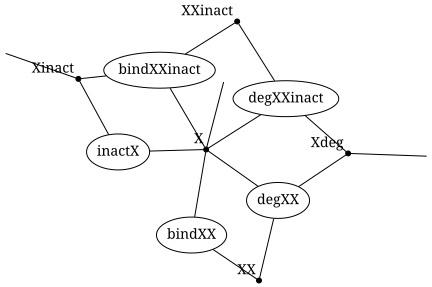

In [4]:
catX = @relation (X, Xinact, Xdeg) where (X, Xinact, Xdeg, XX, XXinact) begin
  inactX(X, Xinact)
  bindXX(X, XX)
  degXX(XX, X, Xdeg)
  bindXXinact(X, Xinact, XXinact)
  degXXinact(XXinact, X, Xdeg)
end
display_uwd(catX)

## Cathepsin *X* reacting with Substrate *Y*

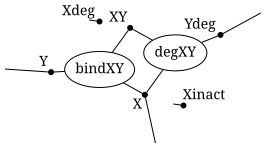

In [5]:
catXsubY = @relation (X, Xinact, Xdeg, Y, Ydeg) where (X, Xinact, Xdeg, Y, XY, Ydeg) begin
  bindXY(X, Y, XY)
  degXY(XY, X, Ydeg)
end
display_uwd(catXsubY)

## Cathepsin *X* reacting with Cathepsin *Y*

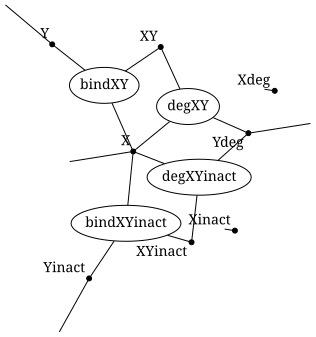

In [6]:
catXY = @relation (X, Xinact, Xdeg, Y, Yinact, Ydeg) where (X, Xinact, Xdeg, Y, Yinact, Ydeg, XY, XYinact) begin
  bindXY(X, Y, XY)
  degXY(XY, X, Ydeg)
  bindXYinact(X, Yinact, XYinact)
  degXYinact(XYinact, X, Ydeg)
end
display_uwd(catXY)

## Define all enzyme reactions

In [7]:
rxns = Dict(
  :K => [inact(K, 7.494e-10)
         bind(K, K, 7.814e-4, 3.867e-3)
         deg(K, K, 2.265e-1)
         bind(K, Kinact, 7.814e-4, 3.867e-3)
         deg(K, Kinact, 2.265e-1)],
  :S => [inact(S, 7.494e-10)
         bind(S, S, 7.814e-4, 3.867e-3)
         deg(S, S, 2.265e-1)
         bind(S, Sinact, 7.814e-4, 3.867e-3)
         deg(S, Sinact, 2.265e-1)],
  :L => [inact(L, 7.494e-10)
         bind(L, L, 7.814e-4, 3.867e-3)
         deg(L, L, 2.265e-1)
         bind(L, Linact, 7.814e-4, 3.867e-3)
         deg(L, Linact, 2.265e-1)],
  :KE => [bind(K, E, 9.668e-6, 1e-2)
          deg(K, E, 1.728e0)],
  :KG => [bind(K, G, 2.764e-6, 8.78e-1)
          deg(K, G, 1.502)],
  :SE => [bind(S, E, 4.197e-7, 1.06e-3)
          deg(S, E, 1.384e4)],
  :SG => [bind(S, G, 5.152e-8, 3.894e-3)
          deg(S, G, 8.755e-1)],
  :LE => [bind(L, E, 1.977e-8, 1e-2)
          deg(L, E, 1.066e2)],
  :LG => [bind(L, G, 3.394e-8, 2.365e1)
          deg(L, G, 4.352)],
  :KS => [bind(K, S, 8.822e-4, 4.114e5)
          deg(K, S, 9e-10)
          bind(K, Sinact, 8.822e-4, 4.114e5)
          deg(K, Sinact, 9e-10)],
  :KL => [bind(K, L, 1.756e-4, 3.729e4)
          deg(K, L, 6.505e6)
          bind(K, Linact, 1.756e-4, 3.729e4)
          deg(K, Linact, 6.505e6)],
  :SK => [bind(S, K, 8.822e-4, 4.114e5)
          deg(S, K, 9e-10)
          bind(S, Kinact, 8.822e-4, 4.114e5)
          deg(S, Kinact, 9e-10)],
  :SL => [bind(S, L, 1e-3, 5e2)
          deg(S, L, 1e-7)
          bind(S, Linact, 1e-3, 5e2)
          deg(S, Linact, 1e-7)],
  :LK => [bind(L, K, 1e-3, 4.118e3)
          deg(L, K, 3.234e1)
          bind(L, Kinact, 1e-3, 4.118e3)
          deg(L, Kinact, 3.234e1)],
  :LS => [bind(L, S, 1.056e-12, 5e2)
          deg(L, S, 5e-1)
          bind(L, Sinact, 1.056e-12, 5e2)
          deg(L, Sinact, 5e-1)]
);

## Helper functions to generate oapply calls

In [8]:
cat(cat) = begin
  catsym = first(cat)
  out = oapply(catX, Dict([:inactX, :bindXX, :degXX, :bindXXinact, :degXXinact] .=> rxns[catsym]), Dict(
    :X=>ob(cat),
    :Xinact=>ob(Symbol(catsym,:inact)=>0),
    :Xdeg=>ob(Symbol(catsym,:deg)=>0),
    :XX=>ob(Symbol(catsym,catsym)=>0),
    :XXinact=>ob(Symbol(catsym,catsym,:inact)=>0)))
  bundle_legs(out, [[1,2,3]])
end

cat_sub(cat1, sub) = begin
  catsym = first(cat1)
  subsym = first(sub)
  catsub = Symbol(catsym, subsym)
  out = oapply(catXsubY, Dict([:bindXY, :degXY] .=> rxns[catsub]), Dict(
    :X=>ob(cat1),
    :Xinact=>ob(Symbol(catsym,:inact)=>0),
    :Xdeg=>ob(Symbol(catsym,:deg)=>0),
    :Y=>ob(sub),
    :XY=>ob(Symbol(catsym,subsym)=>0),
    :Ydeg=>ob(Symbol(subsym,:deg)=>0)))
  bundle_legs(out, [[1,2,3], [4,5]])
end


cat_cat(cat1, cat2) = begin
  cat1sym = first(cat1)
  cat2sym = first(cat2)
  catcat = Symbol(cat1sym, cat2sym)
  out = oapply(catXY, Dict([:bindXY, :degXY, :bindXYinact, :degXYinact] .=> rxns[catcat]), Dict(
    :X=>ob(cat1),
    :Xinact=>ob(Symbol(cat1sym,:inact)=>0),
    :Xdeg=>ob(Symbol(cat1sym,:deg)=>0),
    :Y=>ob(cat2),
    :Yinact=>ob(Symbol(cat2sym,:inact)=>0),
    :Ydeg=>ob(Symbol(cat2sym,:deg)=>0),
    :XY=>ob(catcat=>0),
    :XYinact=>ob(Symbol(catcat,:inact)=>0)))
  bundle_legs(out, [[1,2,3], [4,5,6]])
end

functor(x) = oapply(x, Dict(
  :catK=>cat(K),
  :catS=>cat(S),
  :catL=>cat(L),
  :catKcatS=>cat_cat(K,S),
  :catKcatL=>cat_cat(K,L),
  :catScatK=>cat_cat(S,K),
  :catScatL=>cat_cat(S,L),
  :catLcatK=>cat_cat(L,K),
  :catLcatS=>cat_cat(L,S),
  :catKsubE=>cat_sub(K,E),
  :catSsubE=>cat_sub(S,E),
  :catLsubE=>cat_sub(L,E),
  :catKsubG=>cat_sub(K,G),
  :catSsubG=>cat_sub(S,G),
  :catLsubG=>cat_sub(L,G)));

function enzyme_uwd(enzymes::Array{Symbol}, substrates::Array{Symbol})
  rel = RelationDiagram{Symbol}(0)

  chemicals = vcat(substrates, enzymes)

  subs = add_junctions!(rel, length(substrates), variable=substrates)
  enzs = add_junctions!(rel, length(enzymes), variable=enzymes)
  nsubs = length(subs)
  nenzs = length(enzs)

  catx = add_parts!(rel, :Box, nenzs, name=[Symbol("cat$i") for i in enzymes])
  add_parts!(rel, :Port, nenzs, junction=enzs, box=catx)

  for x in 1:nenzs
    for y in 1:nenzs
      if y != x
        catxy = add_part!(rel, :Box, name=Symbol("cat$(enzymes[x])cat$(enzymes[y])"))
        add_parts!(rel, :Port, 2, junction=[enzs[x], enzs[y]], box=catxy)
      end
    end
  end

  for x in 1:nenzs
    for y in 1:nsubs
      catxy = add_part!(rel, :Box, name=Symbol("cat$(enzymes[x])sub$(substrates[y])"))
      add_parts!(rel, :Port, 2, junction=[enzs[x], subs[y]], box=catxy)
    end
  end
  add_parts!(rel, :OuterPort, length(chemicals), outer_junction = vcat(subs, enzs))
  rel
end

enzyme_reaction(args...) = enzyme_uwd(args...) |> functor |> apex

enzyme_reaction (generic function with 1 method)

# Manually Defining Models

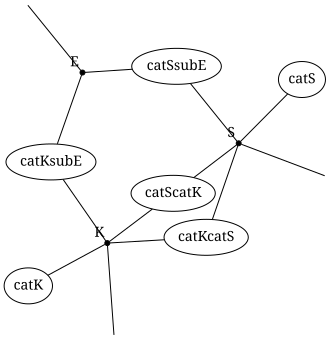

In [9]:
KSE = @relation (K, S, E) begin
  catK(K)
  catS(S)
  catKcatS(K, S)
  catScatK(S, K)
  catKsubE(K, E)
  catSsubE(S, E)
end
display_uwd(KSE)

# Defining Models using API

## CatK, CatS, Elastin

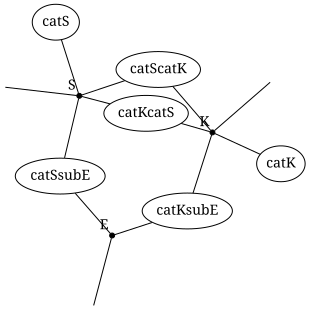

In [10]:
KSE = enzyme_uwd([:K, :S], [:E])
display_uwd(KSE)

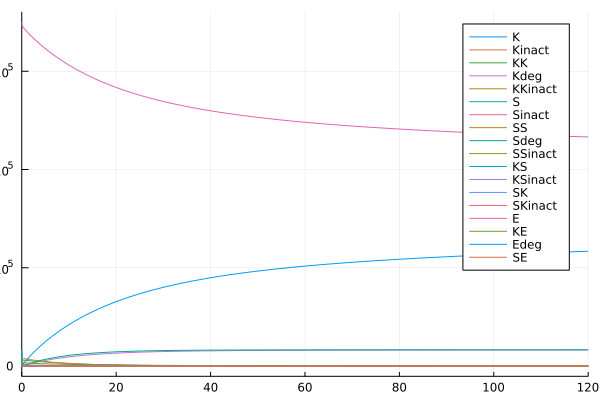

In [11]:
KSE_petri = apex(functor(KSE))
ode_prob = ode(KSE_petri, (0.0, 120.0))
sol = solve(ode_prob)

plot(sol)

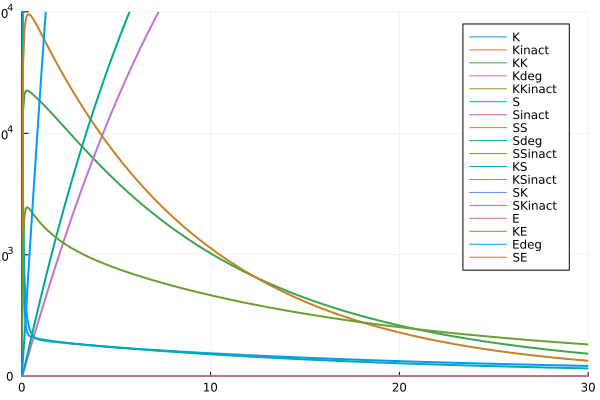

In [12]:
plot(sol, lw = 2, ylims = (0, 15000), xlims = (0, 30))

## CatK, CatS, CatL, Elastin

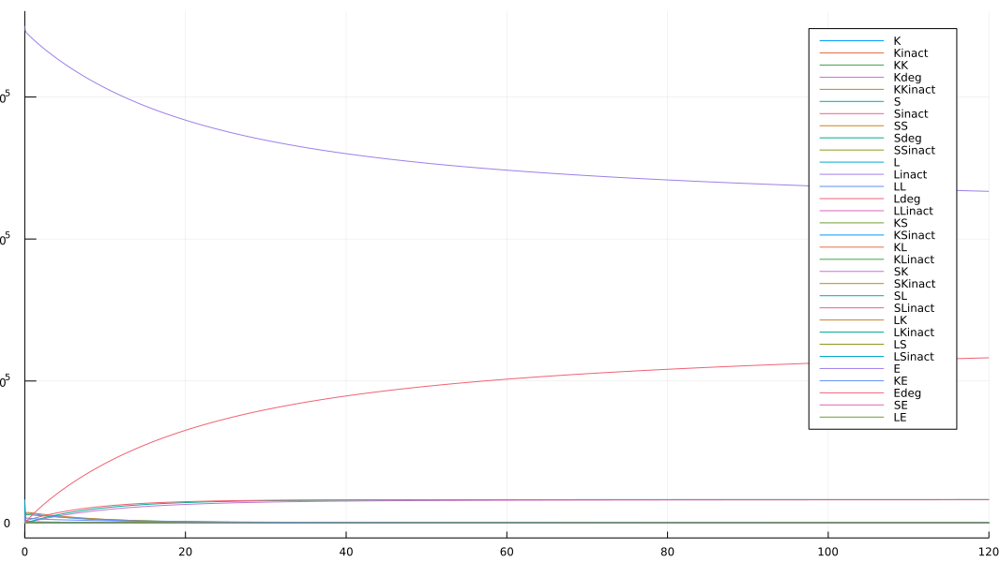

In [13]:
KSLE = enzyme_reaction([:K, :S, :L], [:E])
ode_prob = ode(KSLE, (0.0,120.0))
sol = solve(ode_prob)
plot(sol, lw = 1, size = (1066, 600))

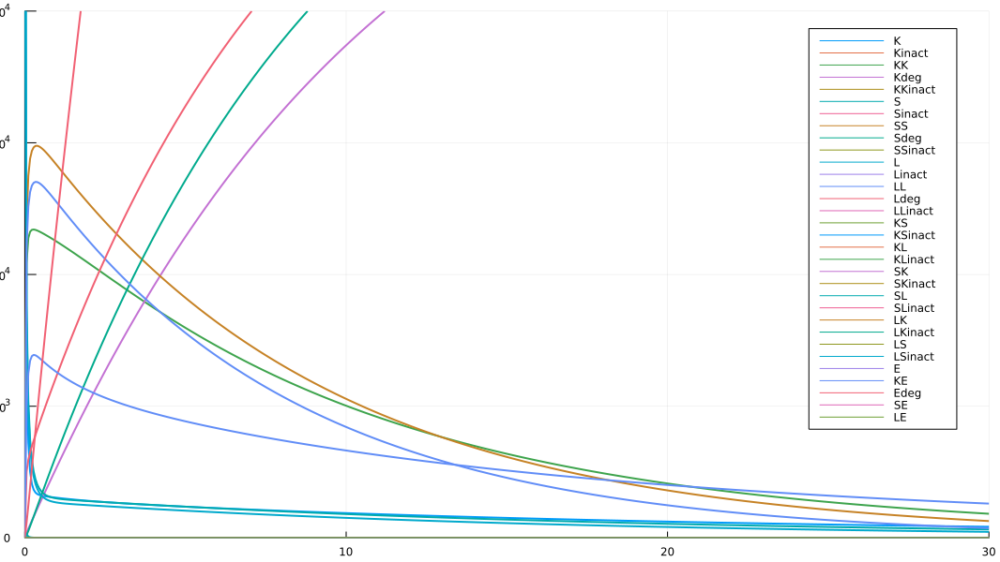

In [14]:
plot(sol, ylims = (0, 20000), xlims = (0, 30), lw = 2, size = (1066, 600))

## CatK, CatS, CatL, Elastin, Gelatin

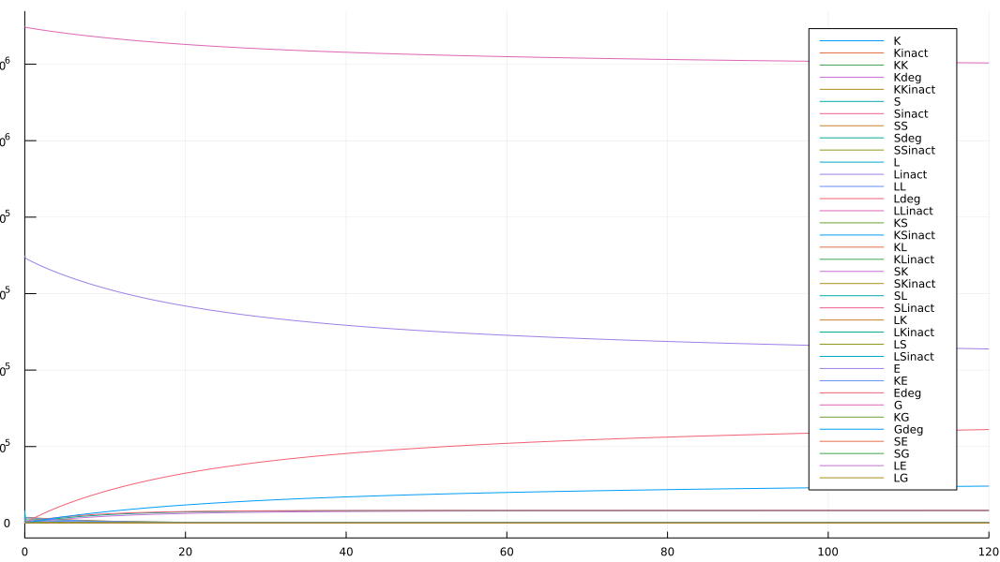

In [15]:
KSLEG = enzyme_reaction([:K, :S, :L], [:E, :G])
ode_prob = ode(KSLEG, (0.0,120.0))
sol = solve(ode_prob)
plot(sol, lw = 1, size = (1066, 600))

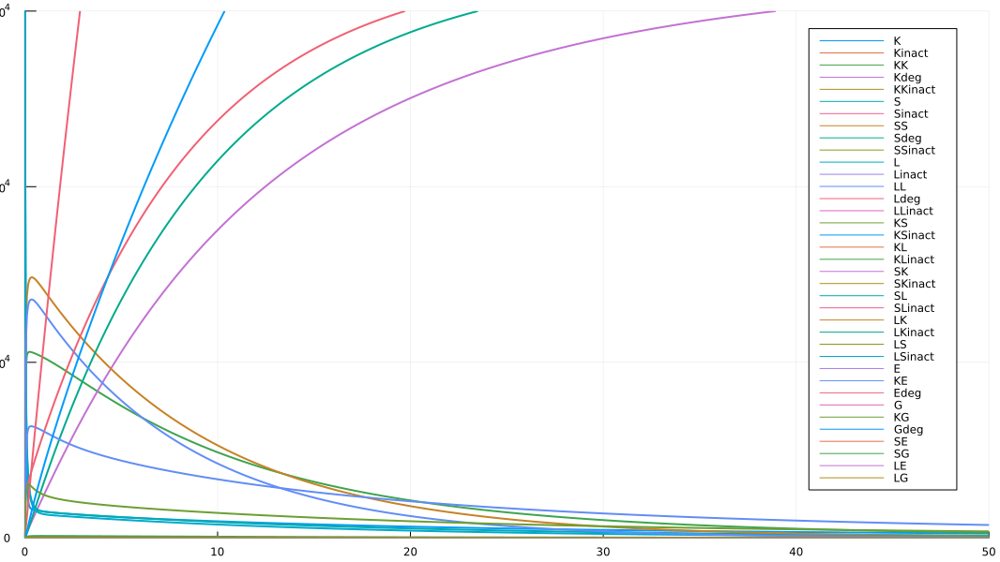

In [16]:
plot(sol, ylims = (0, 30000), xlims = (0, 50), lw = 2, size = (1066, 600))